In [3]:
%load_ext autoreload
%autoreload 2

In [4]:
import numpy as np
import scipy.linalg as la
import matplotlib.pyplot as plt
import sklearn.gaussian_process as gp
import scipy.stats as stats

In [5]:
%matplotlib notebook
plt.style.use('seaborn')

In [6]:
def viz_multivariate_normal(mu,Sigma,x_true):
    n = len(mu)
    fig,axes = plt.subplots(n,n,figsize=3*np.array([n,n]),sharex='col')
    for i in range(len(axes)):
        for j in range(len(axes)):
            ax = axes[i,j]
            if i != j:
                mu_tmp = mu[[j,i]]
                Sigma_tmp = Sigma[np.ix_([j,i],[j,i])]
                xl,xu = mu_tmp[0]-3*Sigma_tmp[0,0]**0.5, mu_tmp[0]+3*Sigma_tmp[0,0]**0.5
                yl,yu = mu_tmp[1]-3*Sigma_tmp[1,1]**0.5, mu_tmp[1]+3*Sigma_tmp[1,1]**0.5
                x,y = np.linspace(xl,xu),np.linspace(yl,yu)
                X,Y = np.meshgrid(x,y,indexing='ij')
                pdf = stats.multivariate_normal.pdf(np.array([X.flatten(),Y.flatten()]).T,mean=mu_tmp,cov=Sigma_tmp)
                ax.pcolormesh(X,Y,pdf.reshape(X.shape),shading='auto')
                ax.plot(x_true[j],x_true[i],'ro') 
                ax.set_xlabel(f'$p_{j}$')
                ax.set_ylabel(f'$p_{i}$')
            else:
#                 fig.delaxes(ax)
                mu_tmp = mu[i]
                sigma_tmp = Sigma[i,i]
                x = np.linspace(mu_tmp-3*sigma_tmp**0.5, mu_tmp+3*sigma_tmp**0.5,1000)
                pdf = stats.norm.pdf(x,loc=mu_tmp,scale=sigma_tmp**0.5)
                ax.plot(x,pdf)
                ax.axvline(x_true[i],c='r')
    plt.tight_layout()
    plt.show()

## Monomial Basis

Let $\mathcal{B} = \{1,x,x^2,\dots,x^n\}$.

If $\mathbf{p} = [p_0,\dots,p_n]^\top$, define $[f(\mathbf{p})](x) = p_0 + p_1x + \dots + p_nx^n$

If $\mathbf{p}$ is unknown, can we recover it from noisy data $\mathbf{b} = \big[[f(\mathbf{p})](x_1)+\varepsilon_1,\dots,[f(\mathbf{p})](x_m)+\varepsilon_m\big]^\top$?

### Linear Problem

If $\mathbf{A}$ is a Vandermonde matrix, that is: $$\mathbf{A} = \begin{bmatrix} 1 & x_1 & \cdots & x_1^n \\
                                 1 & x_2 & \cdots & x_2^n \\
                                 \vdots & \vdots & & \vdots \\
                                 1 & x_n & \cdots & x_m^n
                 \end{bmatrix},$$ 
then $\mathbf{b} = \mathbf{A}\mathbf{p} + \varepsilon$. If $\varepsilon \sim \mathcal{N}(0,\Sigma)$, then the negative log-likelihood function for $\mathbf{p}$ is:

$$-\ell(\mathbf{p}) = ||\mathbf{A}\mathbf{p}-\mathbf{b}||_{\Sigma^{-1}}^2.$$

With a uniform prior distribution on $\mathbf{p}$ the posterior distribution is also multivariate normal. That is $\mathbf{p}|\mathbf{b} \sim \mathcal{N}(\hat\mu,\Gamma)$, where:
\begin{align}
    \hat\mu &= \left(\mathbf{A}^\top\Sigma^{-1}\mathbf{A}\right)^{-1}\mathbf{A}^\top\Sigma^{-1}\mathbf{b} \\
    \Gamma &= \left(\mathbf{A}^\top\Sigma^{-1}\mathbf{A}\right)^{-1}
\end{align}

In [7]:
# dimension parameters
n = 10
m = 5

# true parameters
np.random.seed(2021)
sigma_pr = 2
p = sigma_pr*np.random.randn(n)

# true function
f = np.polynomial.Polynomial(p)

# evaluation domain
x = np.linspace(0,1,m)

# generate data
b = f(x)

# add noise
sigma = 0.02
b_noisy = b + sigma*np.random.randn(m)

<IPython.core.display.Javascript object>


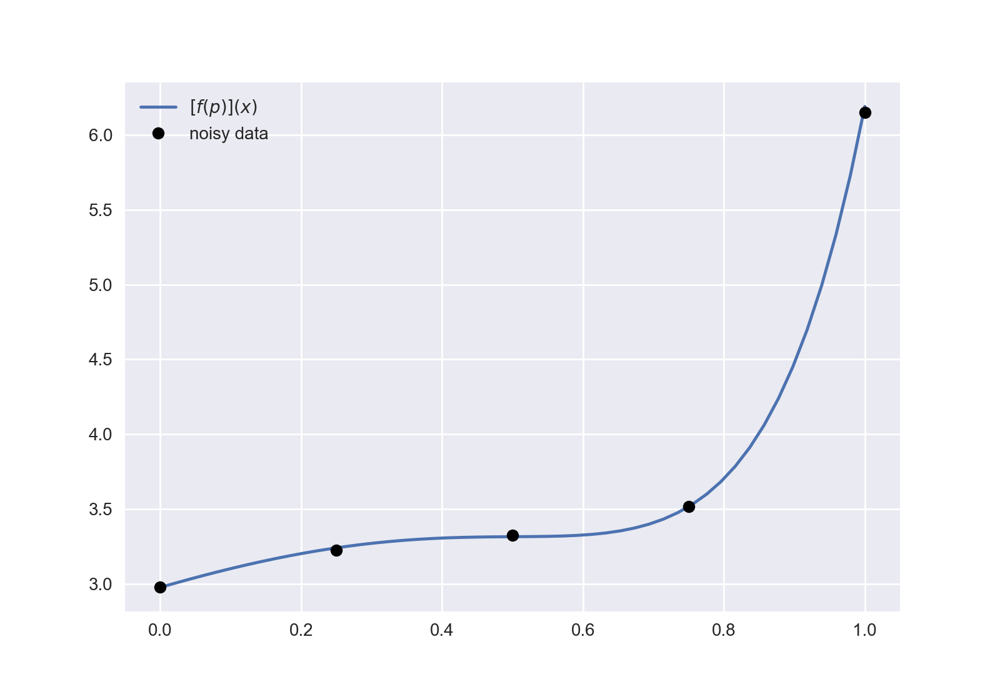

p_true = [ 2.97721811  1.35202174 -0.83690274 -1.61304163  1.11175166 -1.41100857
  2.26171652  1.29000367  0.21282749  0.84430966]


In [8]:
fig = plt.figure()
plt.plot(np.linspace(0,1),f(np.linspace(0,1)),label='$[f(p)](x)$')
plt.plot(x,b_noisy,'ko',label='noisy data')
plt.legend()
plt.show()
print('p_true =',p)

In [9]:
# build matrix
A = np.vander(x,n,increasing=True)

# solve for posterior parameters
prec = (1/sigma_pr**2)*np.eye(n)+A.T@(A/sigma)
mu_hat = la.solve(prec,A.T@(b_noisy/sigma))
Gamma = la.inv(prec)

In [10]:
mu_hat-p

array([ 0.02211488, -0.43606609,  0.39227043,  1.11647975, -1.31419671,
        1.55788524, -1.79793102, -0.56344012,  0.72277721,  0.25390706])

<IPython.core.display.Javascript object>


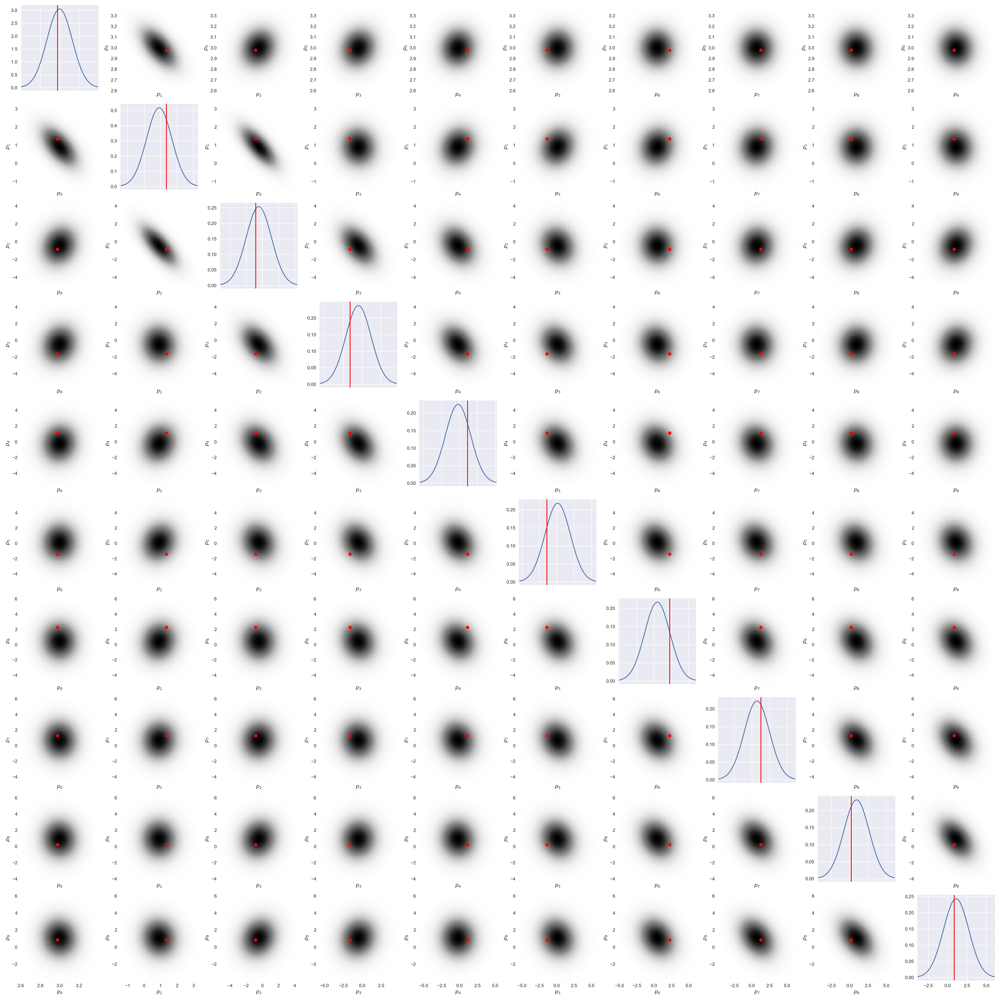

In [11]:
# vizualize
viz_multivariate_normal(mu_hat,Gamma,p)

## Use Gaussian Processes

In [12]:
length_scale = .25
# set up Gaussian process & fit
kernel = gp.kernels.ConstantKernel()*gp.kernels.RBF(length_scale_bounds=(length_scale,length_scale)) \
       + gp.kernels.WhiteKernel(noise_level=sigma**2,noise_level_bounds='fixed')
b_gp = gp.GaussianProcessRegressor(kernel)
b_gp = b_gp.fit(x[:,np.newaxis],b_noisy)

/Users/hringer/anaconda3/lib/python3.8/site-packages/sklearn/gaussian_process/kernels.py:402: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k2__length_scale is close to the specified lower bound 0.25. Decreasing the bound and calling fit again may find a better value.
  warnings.warn("The optimal value found for "


In [13]:
# compute posterior predictive
x_sur = np.linspace(0,1,200)
mean,cov = b_gp.predict(x_sur[:,np.newaxis],return_cov=True)

<IPython.core.display.Javascript object>


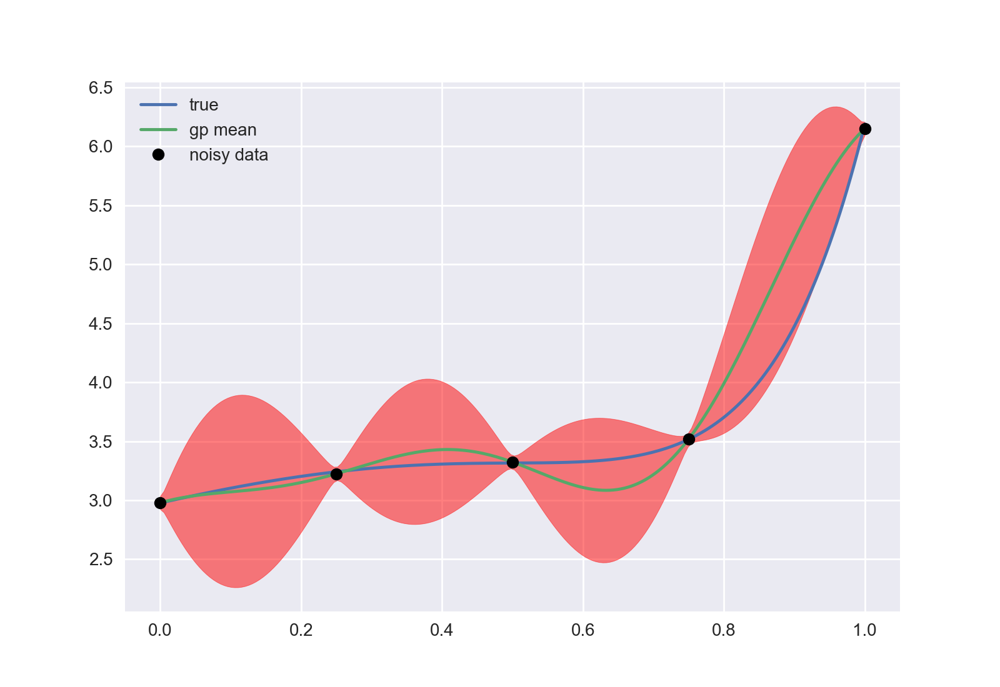

In [14]:
fig = plt.figure()
plt.plot(x_sur,f(x_sur),label='true')
plt.plot(x_sur,mean,label='gp mean')
plt.plot(x,b_noisy,'ko',label='noisy data')
plt.fill_between(x_sur,mean-2*np.diag(cov)**0.5,mean+2*np.diag(cov)**0.5,color='r',alpha=.5)
plt.legend()
plt.show()

In [15]:
A_hat = np.vander(x_sur,n,increasing=True)

In [16]:
prec2 = (1/sigma_pr**2)*np.eye(n)+A_hat.T@la.solve(cov,A_hat)
mu_hat2 = la.solve(prec2,A_hat.T@la.solve(cov,mean))
Gamma2 = la.inv(prec2)

In [17]:
mu_hat2-p

array([ 1.53380936e-03, -1.29526969e-01,  3.95688942e-01,  1.44596665e-01,
       -1.85793830e+00,  1.98119525e+00, -6.95818775e-01,  5.08440737e-01,
        9.12672035e-01, -1.28783579e+00])

<IPython.core.display.Javascript object>


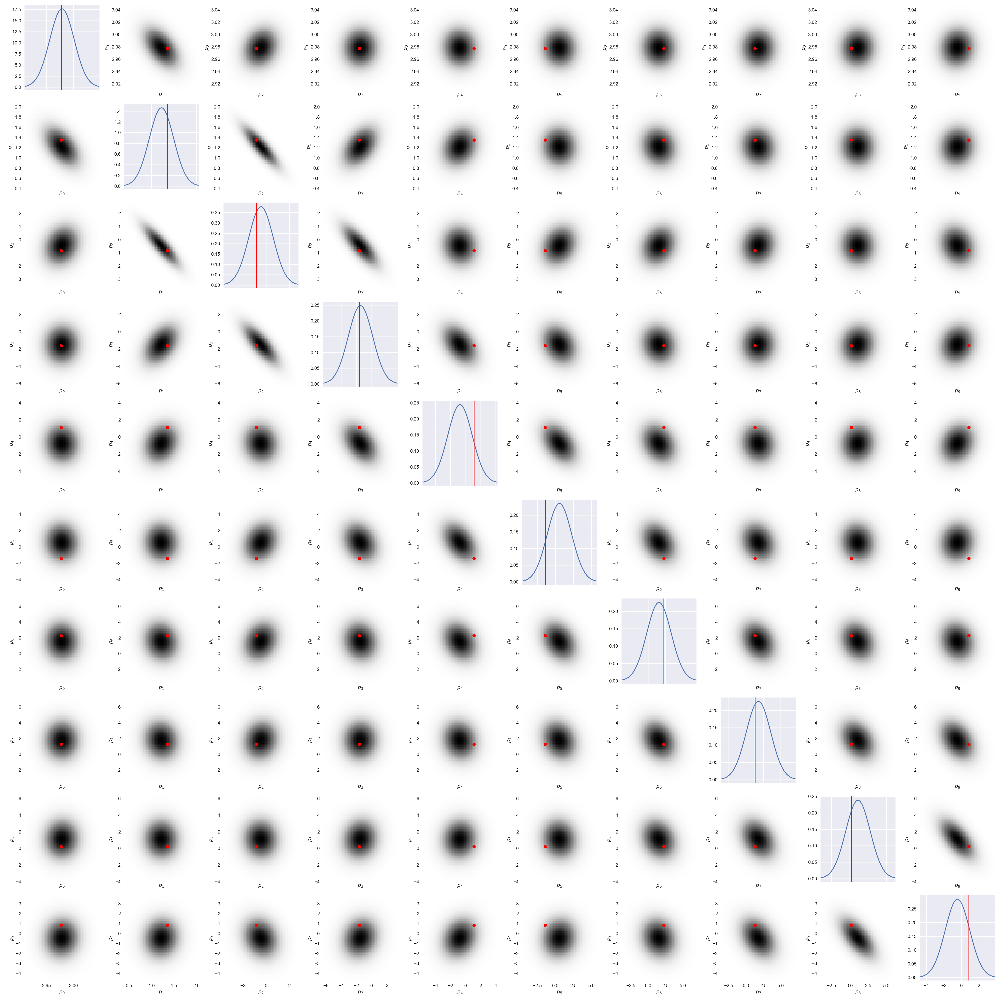

In [18]:
# vizualize
viz_multivariate_normal(mu_hat2,la.inv(prec2),p)

<IPython.core.display.Javascript object>


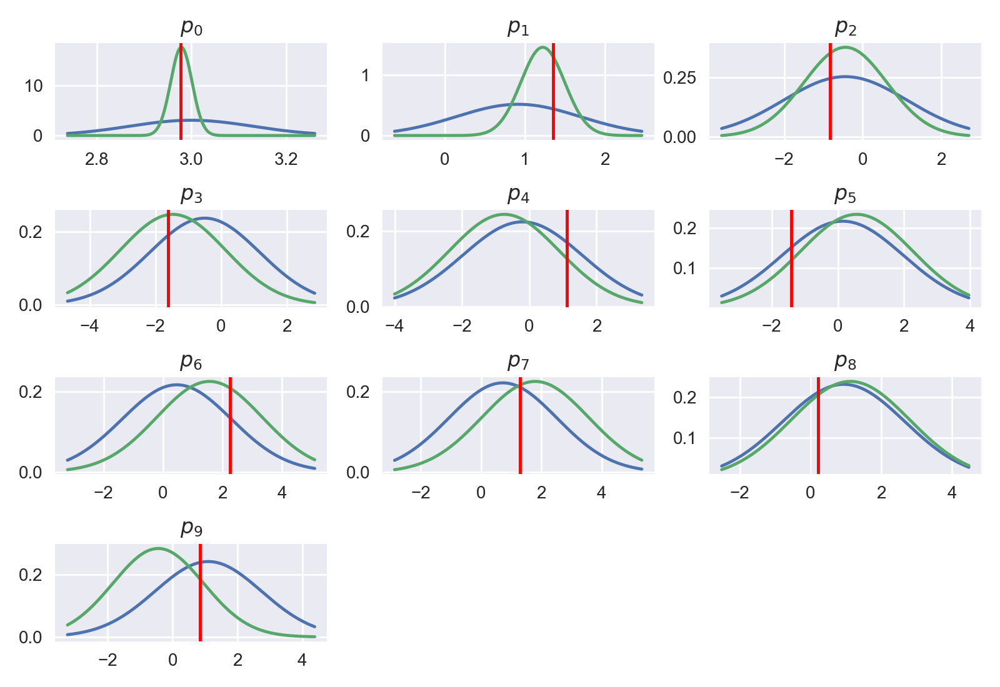

In [19]:
ncol = 3
nrow = int(np.ceil(n/ncol))
fig,axes = plt.subplots(nrow,ncol)
for i,ax in enumerate(axes.flatten()):
    if i >= n:
        fig.delaxes(ax)
    else:
        mu1 = mu_hat[i]
        mu2 = mu_hat2[i]
        sigma1 = Gamma[i,i]**0.5
        sigma2 = Gamma2[i,i]**0.5
        xl,xu = min(mu1-2*sigma1,mu2-2*sigma2),max(mu1+2*sigma1,mu2+2*sigma2)
        x_tmp = np.linspace(xl,xu,1000)
        ax.plot(x_tmp,stats.norm.pdf(x_tmp,loc=mu1,scale=sigma1),label='Standard Posterior')
        ax.plot(x_tmp,stats.norm.pdf(x_tmp,loc=mu2,scale=sigma2),label='GP Posterior')
        ax.axvline(p[i],c='r')
        ax.set_title(f'$p_{i}$')
plt.tight_layout()
plt.show()